# North Sea EMSS25 submarine landslide map

Presentation-oriented PyGMT map using the EMSS25 shapefiles in this folder. Run this notebook from the `gis` conda environment after `pygmt` is installed.

In [38]:
from io import StringIO
from pathlib import Path

import pandas as pd
import pygmt

PROJECT = Path('/home/naveen/tasks/NorthSeaEMSS25Map')
DATA = PROJECT / 'EMSS25'

DEPOSITS = DATA / 'Deposits_EMSS25.shp'
SCARS = DATA / 'Scar_crown_EMSS25.shp'
SOURCES = DATA / 'Source_area_EMSS25.shp'
RELIEF_GRID = PROJECT / 'earth_relief_30s_g.grd'

for path in [DEPOSITS, SCARS, SOURCES]:
    if not path.exists():
        raise FileNotFoundError(path)

pygmt.show_versions()

PyGMT information:
  version: v0.17.0
System information:
  python: 3.11.13 | packaged by conda-forge | (main, Jun  4 2025, 14:48:23) [GCC 13.3.0]
  executable: /home/naveen/miniconda3/envs/gis/bin/python
  machine: Linux-6.18.33.2-microsoft-standard-WSL2-x86_64-with-glibc2.39
Dependency information:
  numpy: 2.2.6
  pandas: 2.3.2
  xarray: 2026.2.0
  packaging: 25.0
  contextily: None
  geopandas: 1.1.1
  IPython: 9.6.0
  pyarrow: 24.0.0
  rioxarray: 0.19.0
  gdal: 3.10.3
  ghostscript: 10.08.0
GMT library information:
  version: 6.5.0
  padding: 2
  share dir: /home/naveen/miniconda3/envs/gis/share/gmt
  plugin dir: /home/naveen/miniconda3/envs/gis/lib/gmt/plugins
  library path: /home/naveen/miniconda3/envs/gis/lib/libgmt.so
  cores: 8
  grid layout: rows
  image layout: 
  binary version: 6.5.0


## Slide Map

The EMSS25 shapefiles are plotted directly and clipped by the PyGMT map region. This view covers mainland Norway and the surrounding North Sea, Norwegian Sea, and Barents Sea margins so the northern landslide events are included.

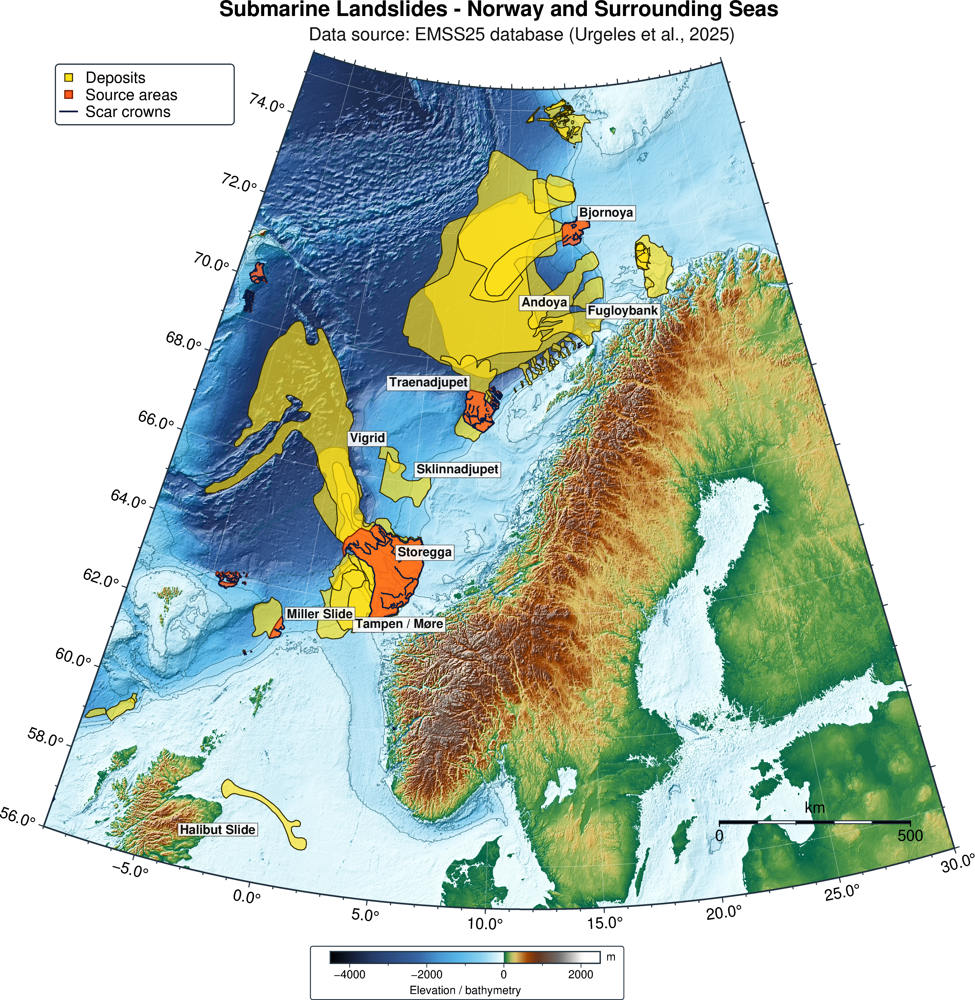

PosixPath('/home/naveen/tasks/NorthSeaEMSS25Map/northsea_emss25_slide_map.png')

In [43]:
region = [-9, 30, 56, 75.5]
projection = 'L12/66/56/75.5/27c'

output_png = PROJECT / 'northsea_emss25_slide_map.png'

labels = pd.DataFrame(
    {
        'lon': [4.1133, 2.4140, 4.7428, 3.4321, 15.1292, 15.1548, 15.2013, 8.3153, -1.0665, 0.1197],
        'lat': [63.9067, 63.0364, 65.9231, 66.5159, 69.9975, 70.6774, 72.1279, 68.0999, 62.0175, 57.7043],
        'text': [
            'Storegga',
            'Tampen / Møre',
            'Sklinnadjupet',
            'Vigrid',
            'Andoya',
            'Fugloybank',
            'Bjornoya',
            'Traenadjupet',
            'Miller Slide',
            'Halibut Slide',
        ],
        'dx': [0.45, 0.35, 0.35, -0.45, -0.70, 0.70, 0.45, -0.55, 0.35, -0.35],
        'dy': [0.30, -0.45, 0.30, 0.35, 0.35, -0.55, 0.34, 0.30, 0.30, -0.35],
        'justify': ['LB', 'LT', 'LB', 'RB', 'RB', 'LB', 'LB', 'RB', 'LB', 'RT'],
    }
)

with pygmt.config(
    FONT='13p,Helvetica',
    FONT_TITLE='18p,Helvetica-Bold',
    GMT_DATA_UPDATE_INTERVAL='1d',
    MAP_FRAME_TYPE='plain',
    MAP_GRID_PEN_PRIMARY='0.25p,white@55',
    MAP_TICK_PEN_PRIMARY='0.7p,#21313f',
    MAP_FRAME_PEN='1.2p,#21313f',
    FORMAT_GEO_MAP='ddd.x',
):
    fig = pygmt.Figure()

    have_relief = False
    try:
        if RELIEF_GRID.exists():
            relief = pygmt.grdcut(grid=str(RELIEF_GRID), region=region)
        else:
            relief = pygmt.datasets.load_earth_relief(
                resolution='30s',
                region=region,
                registration='gridline',
            )
        shade = pygmt.grdgradient(grid=relief, azimuth=315, normalize='t1')
        pygmt.makecpt(cmap='geo', series=[-4500, 2500, 100], continuous=True)
        fig.grdimage(
            grid=relief,
            region=region,
            projection=projection,
            cmap=True,
            shading=shade,
            frame=['WSne+tSubmarine Landslides - Norway and Surrounding Seas', 'xafg5', 'yafg3'],
        )
        fig.grdcontour(
            grid=relief,
            levels=[-200, -500, -1000, -2000, -3000],
            pen='0.35p,#0a5167@35',
        )
        have_relief = True
    except Exception as exc:
        print(f'Using simple coast background because earth relief is unavailable: {exc}')
        fig.basemap(
            region=region,
            projection=projection,
            frame=['WSne+tEMSS25 Submarine Landslides - Norway and Surrounding Seas', 'xafg5', 'yafg3'],
        )
        fig.coast(land='#d8e7c8', water='#8fd3df', area_thresh=800)

    fig.basemap(
        region=region,
        projection=projection,
        map_scale='jBR+w500k+o1.3c/2.45c+f+lkm',
    )


    # Bold overlay styling: readable from the back of a room.
    fig.plot(data=str(DEPOSITS), fill='#ffe119@35', pen='0.65p,#2b2600')
    fig.plot(data=str(SOURCES), fill='#ff5a1f@20', pen='0.9p,#7a1e00')
    fig.plot(data=str(SCARS), pen='1.0p,#061a40')

    for row in labels.itertuples(index=False):
        fig.text(
            x=row.lon + row.dx,
            y=row.lat + row.dy,
            text=row.text,
            font='10.5p,Helvetica-Bold,#111111',
            fill='white@12',
            pen='0.35p,#111111@30',
            justify=row.justify,
            clearance='0.08c/0.05c',
        )

    legend = StringIO('''
S 0.25c s 0.32c #ffe119 0.65p,#2b2600 0.75c Deposits
S 0.25c s 0.32c #ff5a1f 0.90p,#7a1e00 0.75c Source areas
S 0.25c - 0.55c #061a40 1.30p,#061a40 0.75c Scar crowns
''')
    fig.legend(
        spec=legend,
        position='JTL+jTL+o0.35c/0.35c+w5.3c',
        box='+gwhite@8+p0.8p,#21313f+r3p',
    )

    if have_relief:
        fig.colorbar(
            position='JBC+w8.0c/0.35c+o-1c/1.25c+h',
            frame=['xaf+lElevation / bathymetry', 'y+l m'],
            box='+gwhite@12+p0.6p,#21313f+r2p',
        )

    fig.text(
        position='jTC',
        offset='j6.5c/-0.75c',
        text='Data source: EMSS25 database (Urgeles et al., 2025)',
        font='15p,Helvetica,#111111',
        justify='TR',
        clearance='0.06c/0.04c',
        no_clip=True,
    )

    fig.savefig(output_png, dpi=200)
    fig.show()

output_png